# Hand Recognition - Backend Code 




##- Team Mates 

####- Aniv Chakravarty - 11424113 - anivchakravaty@my.unt.edu
####- Amardweep Reddy Lakku - 11554827 - amardweepreddylakku@my.unt.edu
####- Nisanth Simhadri - 11607161 - nisanthsimhadri@my.unt.edu
####- Nitin Dunday Mohan - 11515126 - nitindundaymohan@my.unt.edu


##- Objective :




Our objective is to be able to receive input data from the front end team in order to train on our model and send the output back to the front end team through the pipeline.

##- Reseach Work :

##GCP research:  

##Ngrok research:  

##- Future Work :

##- Working Code :

-- Import Statements:

In [ ]:
#Flask installation
!pip install flask-ngrok
!curl -O https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.tgz # HTTPS request and response
!tar -xf ngrok-stable-linux-amd64.tgz
!./ngrok authtoken 2FCS6Ojtv7WXtRzyRjMM594Hb5q_Z4fSVK4fiN5WrHwUqJBc # Authorization

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 13.1M  100 13.1M    0     0  35.1M      0 --:--:-- --:--:-- --:--:-- 35.1M
Authtoken saved to configuration file: /root/.ngrok2/ngrok.yml


In [ ]:
# importing packages
from flask import Flask, request, send_file
from pandas.core.internals import concat
from flask_ngrok import run_with_ngrok
import base64
import io
import os
from PIL import Image
import json

import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from pandas import concat



### -JSON Input data 

In [ ]:

app = Flask(__name__)

input1 = [] # Creating a list to add the data from the input source

@app.route("/")
def root():
  return 'Root of Flask WebApp!'

@app.route("/train", methods=["POST"])
def train_data():
    content = request.get_json()
    appname = content.get('name')
    labelname = content.get('label')
    input1 = content.get('data')
    return json.dumps({'msg': 'success', 'response' : 'Trained Successfully'})


@app.route("/predict", methods=["POST"])
def predict_data():
    content = request.get_json()
    input1 = content.get('data')
    label = predict_gesture(input1) #Model output
    return label

run_with_ngrok(app)

app.run()

 * Serving Flask app "__main__" (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: off


INFO:werkzeug: * Running on http://127.0.0.1:5000/ (Press CTRL+C to quit)


 * Running on http://0e63-34-74-151-79.ngrok.io
 * Traffic stats available on http://127.0.0.1:4040


### EG 1 : Gesture JSON data collected - " want to rest "

In [ ]:
"""
{
    "name" : "Bend wrist outward right hand",
    "label" : "want to rest",
    "key_id" : 0,
    "time" : 1645732896831,
    "userId": "dbhlWevKUePfKLXNNM2CWswc13l1",
    "data": [[-1.7688941955566406, 1.9256240129470825, 9.213563919067383], [-1.5780665874481201, 1.8065811395645142, 9.576674461364746], [-0.25423741340637207, 3.2446675300598145, 9.69093132019043], [0.3936193287372589, 5.745765209197998, 9.623334884643555], [0.039481572806835175, 7.557132244110107, 7.319644451141357], [-2.9832515716552734, 7.824530124664307, 3.0592236518859863], [-5.409573554992676, 7.141379356384277, -0.44386860728263855], [-7.4500532150268555, 5.718846321105957, -0.9188438653945923], [-7.634300708770752, 5.744568824768066, -1.4733805656433105], [-7.579864025115967, 6.040680885314941, -1.3549357652664185], [-7.536793231964111, 6.108277797698975, -1.3561322689056396], [-7.533204078674316, 6.0538411140441895, -1.425524115562439], [-7.573283672332764, 5.802595138549805, -1.333998680114746], [-6.45523738861084, 5.057230472564697, 0.4576273262500763], [-1.7964116334915161, 7.277770042419434, 4.107280254364014], [-0.5994020700454712, 3.451646566390991, 11.00160026550293], [-0.8811569213867188, 1.6121642589569092, 10.735997200012207], [-0.7399803996086121, 1.2083754539489746, 10.123434066772461], [1.7407784461975098, 5.114060401916504, 11.650054931640625], [-0.6969096064567566, 7.265207767486572, 4.84606409072876], [-4.207778453826904, 7.114459991455078, 0.39541393518447876], [-6.477969169616699, 6.507879257202148, -0.7525427341461182]]}
"""

'\n{\n    "name" : "Bend wrist outward right hand",\n    "label" : "want to rest",\n    "key_id" : 0,\n    "time" : 1645732896831,\n    "userId": "dbhlWevKUePfKLXNNM2CWswc13l1",\n    "data": [[-1.7688941955566406, 1.9256240129470825, 9.213563919067383], [-1.5780665874481201, 1.8065811395645142, 9.576674461364746], [-0.25423741340637207, 3.2446675300598145, 9.69093132019043], [0.3936193287372589, 5.745765209197998, 9.623334884643555], [0.039481572806835175, 7.557132244110107, 7.319644451141357], [-2.9832515716552734, 7.824530124664307, 3.0592236518859863], [-5.409573554992676, 7.141379356384277, -0.44386860728263855], [-7.4500532150268555, 5.718846321105957, -0.9188438653945923], [-7.634300708770752, 5.744568824768066, -1.4733805656433105], [-7.579864025115967, 6.040680885314941, -1.3549357652664185], [-7.536793231964111, 6.108277797698975, -1.3561322689056396], [-7.533204078674316, 6.0538411140441895, -1.425524115562439], [-7.573283672332764, 5.802595138549805, -1.333998680114746], [-6

### EG 2 : Gesture JSON data collected - " Hello " 

In [ ]:
"""
{
  "name": "waving",
  "label" : "Hello",
  "key_id" : 1,
  "time": "1644622107453",
  "userId": "hIMWm6XvwQd64HcSnR3nQKowjgy2",
  "data": "[[0.352875292301178, 6.181118011474609, 8.738357543945312], [0.697824239730835, 6.305683135986328, 4.91900634765625], [-10.395156860351562, 2.8188250064849854, 7.262742519378662], [-10.394200325012207, -6.555161952972412, 4.458116054534912], [22.803300857543945, -3.3222243785858154, 4.74365758895874], [8.89515209197998, -4.542960166931152, 5.6299848556518555], [-10.395157814025879, -0.9602822065353394, 2.4027957916259766], [-16.789169311523438, -5.386168479919434, 5.927023887634277], [12.357098579406738, -9.77468490600586, 3.32745099067688], [23.909053802490234, -3.0165610313415527, 5.4718828201293945], [-4.760034084320068, -2.8987033367156982, 2.7266645431518555], [-17.97540855407715, 0.04486062377691269, 1.1001346111297607], [-3.6882972717285156, -6.5393524169921875, 3.8726611137390137], [24.747472763061523, -1.8882906436920166, 3.527233600616455], [5.801151752471924, -6.075587272644043, 5.117831230163574], [-19.022714614868164, -8.375246047973633, -2.876359701156616], [-12.280400276184082, -8.630125045776367, 1.7138563394546509], [18.943706512451172, -5.480071067810059, 1.9720890522003174], [18.22314453125, -3.8295865058898926, 5.435471534729004], [-10.423903465270996, -6.0722336769104, -1.4184715747833252], [-12.134275436401367, -6.297408580780029, -0.4746529161930084], [-14.697437286376953, -6.623193740844727, -1.0735225677490234], [-16.896486282348633, -6.800458908081055, -3.028233051300049], [-17.897796630859375, -6.786086082458496, -3.0857245922088623], [-18.458337783813477, -7.006470203399658, -2.5491373538970947], [-19.047626495361328, -6.407600402832031, -2.0077590942382812], [-18.894315719604492, -5.894968032836914, -2.391035795211792], [-18.027151107788086, -5.626674652099609, -2.1514878273010254], [-16.930023193359375, -5.185906410217285, -1.035194993019104], [-16.59944725036621, -4.361861705780029, -0.9920762777328491], [-16.4317626953125, -4.160641670227051, -1.8257029056549072]]"
}

"""

'\n{\n  "name": "waving",\n  "label" : "Hello",\n  "key_id" : 1,\n  "time": "1644622107453",\n  "userId": "hIMWm6XvwQd64HcSnR3nQKowjgy2",\n  "data": "[[0.352875292301178, 6.181118011474609, 8.738357543945312], [0.697824239730835, 6.305683135986328, 4.91900634765625], [-10.395156860351562, 2.8188250064849854, 7.262742519378662], [-10.394200325012207, -6.555161952972412, 4.458116054534912], [22.803300857543945, -3.3222243785858154, 4.74365758895874], [8.89515209197998, -4.542960166931152, 5.6299848556518555], [-10.395157814025879, -0.9602822065353394, 2.4027957916259766], [-16.789169311523438, -5.386168479919434, 5.927023887634277], [12.357098579406738, -9.77468490600586, 3.32745099067688], [23.909053802490234, -3.0165610313415527, 5.4718828201293945], [-4.760034084320068, -2.8987033367156982, 2.7266645431518555], [-17.97540855407715, 0.04486062377691269, 1.1001346111297607], [-3.6882972717285156, -6.5393524169921875, 3.8726611137390137], [24.747472763061523, -1.8882906436920166, 3.52723

### EG 3 : Gesture JSON data collected 

In [ ]:
"""
{
  "name": "Heart",
  "label": "Thank you",
  "key_id" : 2,
  "time": "1645733062258",
  "userId": "dbhlWevKUePfKLXNNM2CWswc13l1",
  "data": "[[0.08315058797597885, 7.874181270599365, 5.084748268127441], [-0.7082754969596863, 11.48794174194336, 3.1728827953338623], [-3.675375461578369, 9.68375301361084, 3.394218921661377], [-0.9218349456787109, 4.944169998168945, -0.865005373954773], [3.362514019012451, 7.318448066711426, -1.566102385520935], [4.010969161987305, 9.342177391052246, 0.7328019142150879], [2.6703901290893555, 9.880562782287598, 3.920639991760254], [-0.02871387079358101, 8.474181175231934, 5.879763603210449], [-1.059422254562378, 9.288339614868164, 6.903891563415527], [3.259622573852539, 9.074779510498047, 4.8777689933776855], [3.2781670093536377, 10.259825706481934, 5.960521221160889], [-4.383052825927734, 10.331609725952148, 7.753942012786865], [-3.0418758392333984, 6.096911907196045, 2.4149563312530518], [0.7286145091056824, 5.088337421417236, -2.451446771621704], [2.485544443130493, 8.281558990478516, -2.757728099822998], [0.9343972206115723, 11.977871894836426, 0.4731806814670563], [-0.3517449200153351, 10.462616920471191, 1.174277663230896], [-0.3798605799674988, 9.627521514892578, 0.8835497498512268], [-0.4085744619369507, 9.725028991699219, 0.9954141974449158], [-0.27696922421455383, 9.784850120544434, 0.9457631707191467], [-0.21236300468444824, 9.680164337158203, 0.8482556343078613]]"
}
"""

'\n{\n  "name": "Heart",\n  "label": "Thank you",\n  "key_id" : 2,\n  "time": "1645733062258",\n  "userId": "dbhlWevKUePfKLXNNM2CWswc13l1",\n  "data": "[[0.08315058797597885, 7.874181270599365, 5.084748268127441], [-0.7082754969596863, 11.48794174194336, 3.1728827953338623], [-3.675375461578369, 9.68375301361084, 3.394218921661377], [-0.9218349456787109, 4.944169998168945, -0.865005373954773], [3.362514019012451, 7.318448066711426, -1.566102385520935], [4.010969161987305, 9.342177391052246, 0.7328019142150879], [2.6703901290893555, 9.880562782287598, 3.920639991760254], [-0.02871387079358101, 8.474181175231934, 5.879763603210449], [-1.059422254562378, 9.288339614868164, 6.903891563415527], [3.259622573852539, 9.074779510498047, 4.8777689933776855], [3.2781670093536377, 10.259825706481934, 5.960521221160889], [-4.383052825927734, 10.331609725952148, 7.753942012786865], [-3.0418758392333984, 6.096911907196045, 2.4149563312530518], [0.7286145091056824, 5.088337421417236, -2.45144677162170

Explanation :

-> The Name is used as the Label in the model

-> The UserID is used as the unique id for an user. 

-> Data is used as the imput points for a particular gesture data.

##- Feature Engineering :

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
dir_path = "/content/drive/MyDrive/Gesture_files/Sample_Data"

In [ ]:
entries = os.listdir(dir_path+'/')
print(entries)

['sample1.json', 'sample2.json', 'sample3.json']


In [ ]:
#testing - Sample1.json
{
  "name": "Heart",
  "label": "Thank you",
  "key_id" : 2,
  "time": "1645733062258",
  "userId": "dbhlWevKUePfKLXNNM2CWswc13l1",
  "data": "[[0.08315058797597885, 7.874181270599365, 5.084748268127441], [-0.7082754969596863, 11.48794174194336, 3.1728827953338623], [-3.675375461578369, 9.68375301361084, 3.394218921661377], [-0.9218349456787109, 4.944169998168945, -0.865005373954773], [3.362514019012451, 7.318448066711426, -1.566102385520935], [4.010969161987305, 9.342177391052246, 0.7328019142150879], [2.6703901290893555, 9.880562782287598, 3.920639991760254], [-0.02871387079358101, 8.474181175231934, 5.879763603210449], [-1.059422254562378, 9.288339614868164, 6.903891563415527], [3.259622573852539, 9.074779510498047, 4.8777689933776855], [3.2781670093536377, 10.259825706481934, 5.960521221160889], [-4.383052825927734, 10.331609725952148, 7.753942012786865], [-3.0418758392333984, 6.096911907196045, 2.4149563312530518], [0.7286145091056824, 5.088337421417236, -2.451446771621704], [2.485544443130493, 8.281558990478516, -2.757728099822998], [0.9343972206115723, 11.977871894836426, 0.4731806814670563], [-0.3517449200153351, 10.462616920471191, 1.174277663230896], [-0.3798605799674988, 9.627521514892578, 0.8835497498512268], [-0.4085744619369507, 9.725028991699219, 0.9954141974449158], [-0.27696922421455383, 9.784850120544434, 0.9457631707191467], [-0.21236300468444824, 9.680164337158203, 0.8482556343078613]]"
}


{'name': 'Heart',
 'label': 'Thank you',
 'key_id': 2,
 'time': '1645733062258',
 'userId': 'dbhlWevKUePfKLXNNM2CWswc13l1',
 'data': '[[0.08315058797597885, 7.874181270599365, 5.084748268127441], [-0.7082754969596863, 11.48794174194336, 3.1728827953338623], [-3.675375461578369, 9.68375301361084, 3.394218921661377], [-0.9218349456787109, 4.944169998168945, -0.865005373954773], [3.362514019012451, 7.318448066711426, -1.566102385520935], [4.010969161987305, 9.342177391052246, 0.7328019142150879], [2.6703901290893555, 9.880562782287598, 3.920639991760254], [-0.02871387079358101, 8.474181175231934, 5.879763603210449], [-1.059422254562378, 9.288339614868164, 6.903891563415527], [3.259622573852539, 9.074779510498047, 4.8777689933776855], [3.2781670093536377, 10.259825706481934, 5.960521221160889], [-4.383052825927734, 10.331609725952148, 7.753942012786865], [-3.0418758392333984, 6.096911907196045, 2.4149563312530518], [0.7286145091056824, 5.088337421417236, -2.451446771621704], [2.48554444313

In [ ]:
#Converting the input data to collect usefull information
#Creating a dataframe - While Testing 
import pandas as pd
import json
df = pd.DataFrame()
for i in range(len(entries)):
  df1 = pd.read_json(dir_path+'/'+entries[i])
  print("The data values per gesture : ",len(df))
  df = df.append(df1, ignore_index = True)



The data values per gesture :  0
The data values per gesture :  21
The data values per gesture :  43


In [ ]:
print(df.info)

<bound method DataFrame.info of       name      label  key_id           time                        userId  \
0    Heart  Thank you       2  1645733062258  dbhlWevKUePfKLXNNM2CWswc13l1   
1    Heart  Thank you       2  1645733062258  dbhlWevKUePfKLXNNM2CWswc13l1   
2    Heart  Thank you       2  1645733062258  dbhlWevKUePfKLXNNM2CWswc13l1   
3    Heart  Thank you       2  1645733062258  dbhlWevKUePfKLXNNM2CWswc13l1   
4    Heart  Thank you       2  1645733062258  dbhlWevKUePfKLXNNM2CWswc13l1   
..     ...        ...     ...            ...                           ...   
69  waving      Hello       1  1644622107453  hIMWm6XvwQd64HcSnR3nQKowjgy2   
70  waving      Hello       1  1644622107453  hIMWm6XvwQd64HcSnR3nQKowjgy2   
71  waving      Hello       1  1644622107453  hIMWm6XvwQd64HcSnR3nQKowjgy2   
72  waving      Hello       1  1644622107453  hIMWm6XvwQd64HcSnR3nQKowjgy2   
73  waving      Hello       1  1644622107453  hIMWm6XvwQd64HcSnR3nQKowjgy2   

                               

In [ ]:
display(df)

,name,label,key_id,time,userId,data
0,Heart,Thank you,2,1645733062258,dbhlWevKUePfKLXNNM2CWswc13l1,"[0.083150587975978, 7.874181270599365, 5.08474..."
1,Heart,Thank you,2,1645733062258,dbhlWevKUePfKLXNNM2CWswc13l1,"[-0.7082754969596861, 11.48794174194336, 3.172..."
2,Heart,Thank you,2,1645733062258,dbhlWevKUePfKLXNNM2CWswc13l1,"[-3.675375461578369, 9.68375301361084, 3.39421..."
3,Heart,Thank you,2,1645733062258,dbhlWevKUePfKLXNNM2CWswc13l1,"[-0.92183494567871, 4.944169998168945, -0.8650..."
4,Heart,Thank you,2,1645733062258,dbhlWevKUePfKLXNNM2CWswc13l1,"[3.362514019012451, 7.318448066711426, -1.5661..."
...,...,...,...,...,...,...
69,waving,Hello,1,1644622107453,hIMWm6XvwQd64HcSnR3nQKowjgy2,"[-18.894315719604492, -5.894968032836914, -2.3..."
70,waving,Hello,1,1644622107453,hIMWm6XvwQd64HcSnR3nQKowjgy2,"[-18.027151107788086, -5.626674652099609, -2.1..."
71,waving,Hello,1,1644622107453,hIMWm6XvwQd64HcSnR3nQKowjgy2,"[-16.930023193359375, -5.185906410217285, -1.0..."
72,waving,Hello,1,1644622107453,hIMWm6XvwQd64HcSnR3nQKowjgy2,"[-16.59944725036621, -4.361861705780029, -0.99..."


In [ ]:
df[['X', 'Y', 'Z']] = df['data'].tolist()

In [ ]:
df.drop('data', inplace=True, axis=1)

In [ ]:
display(df)

,name,label,key_id,time,userId,X,Y,Z
0,Heart,Thank you,2,1645733062258,dbhlWevKUePfKLXNNM2CWswc13l1,0.083151,7.874181,5.084748
1,Heart,Thank you,2,1645733062258,dbhlWevKUePfKLXNNM2CWswc13l1,-0.708275,11.487942,3.172883
2,Heart,Thank you,2,1645733062258,dbhlWevKUePfKLXNNM2CWswc13l1,-3.675375,9.683753,3.394219
3,Heart,Thank you,2,1645733062258,dbhlWevKUePfKLXNNM2CWswc13l1,-0.921835,4.944170,-0.865005
4,Heart,Thank you,2,1645733062258,dbhlWevKUePfKLXNNM2CWswc13l1,3.362514,7.318448,-1.566102
...,...,...,...,...,...,...,...,...
69,waving,Hello,1,1644622107453,hIMWm6XvwQd64HcSnR3nQKowjgy2,-18.894316,-5.894968,-2.391036
70,waving,Hello,1,1644622107453,hIMWm6XvwQd64HcSnR3nQKowjgy2,-18.027151,-5.626675,-2.151488
71,waving,Hello,1,1644622107453,hIMWm6XvwQd64HcSnR3nQKowjgy2,-16.930023,-5.185906,-1.035195
72,waving,Hello,1,1644622107453,hIMWm6XvwQd64HcSnR3nQKowjgy2,-16.599447,-4.361862,-0.992076


In [ ]:
# Data frame - While Training
#Execute when you are training

#info_data = [] 
#df = pd.DataFrame(data, columns = ['name', 'label','key_id','time','userId','data'])
 
# print dataframe
#print(df) 

In [ ]:
#using saved dataframe
path =" " #specified file path 
file_name = "  "#Name of the pickle file
total_path = path+"/"+file_name

#Saving the data into pickle
df.to_pickle(total_path)  
#To retrive the data from the pickle
df = pd.read_pickle(total_path)  

FileNotFoundError: ignored

-Data Visualizations based on the imputs :

In [ ]:
#Data visualizations
def plot_hist(x_info,y_info,z_info,df): # Histogram plot is visualized
  sns.histplot(x=x_info, data=df, kde=True)
  plt.show()
  sns.histplot(x=y_info, data=df, kde=True)
  plt.show()
  sns.histplot(x=z_info, data=df, kde=True)
  plt.show()
  return

def plot_graph(x_info,y_info,z_info): 
  fig = plt.figure()
  ax = plt.axes()
  ax.plot(x_info); #Blue
  ax.plot(y_info); #orange
  ax.plot(z_info); #green
  return 

def plot_3d(x_info,y_info,z_info):
  fig = plt.figure()
  ax = fig.add_subplot(111, projection='3d')
  ax.plot(x_info,y_info,z_info)
  ax.set_title("Wave form in 3d visualization")
  ax.set_xlabel("X axis")
  ax.set_ylabel("Y axis")
  ax.set_zlabel("Z axis")
  plt.show()
  return


NameError: ignored

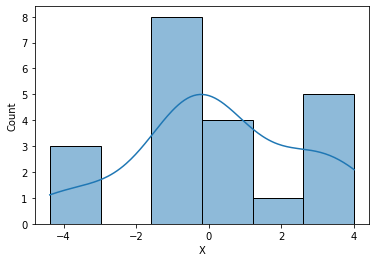

In [ ]:
#Visualizing the data based on the User Gestures
# Gesture 1
plot_hist(df['X'][:21],df['Y'][:21],df['Z'][:21],df[:21])



NameError: ignored

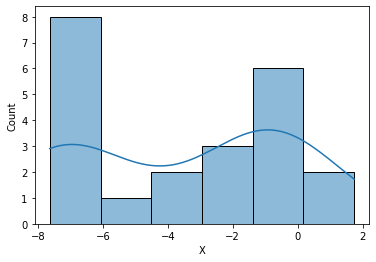

In [ ]:
# Gesture 2
plot_hist(df['X'][21:43],df['Y'][21:43],df['Z'][21:43],df[21:43])


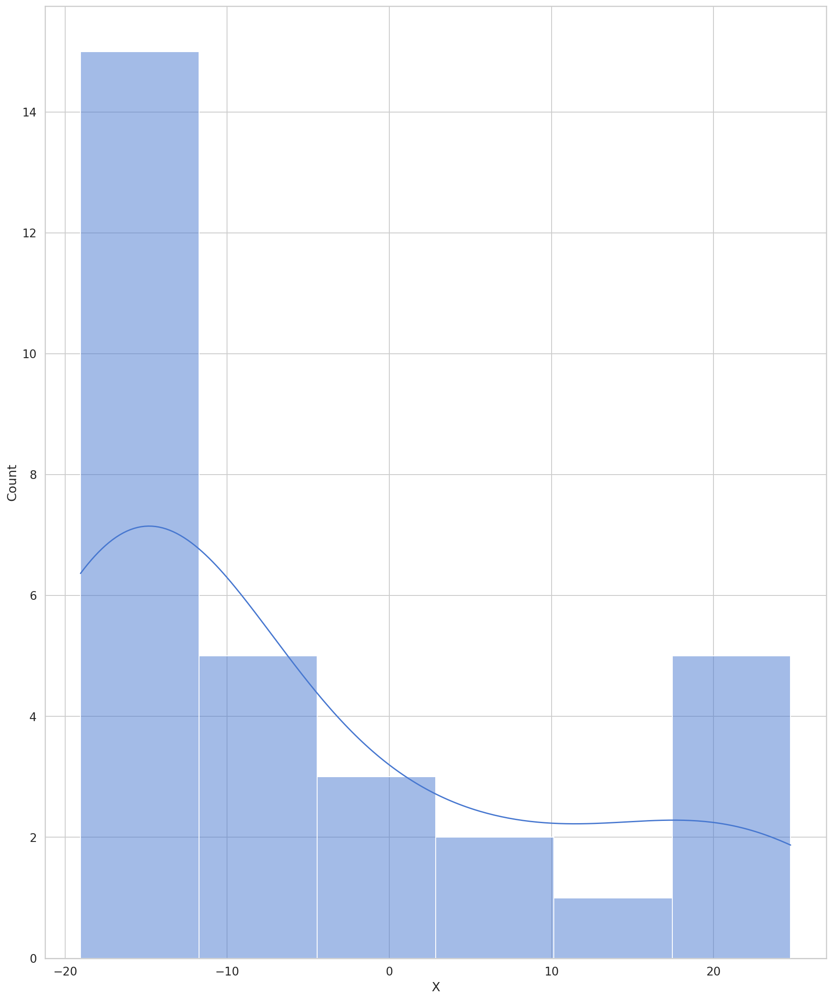

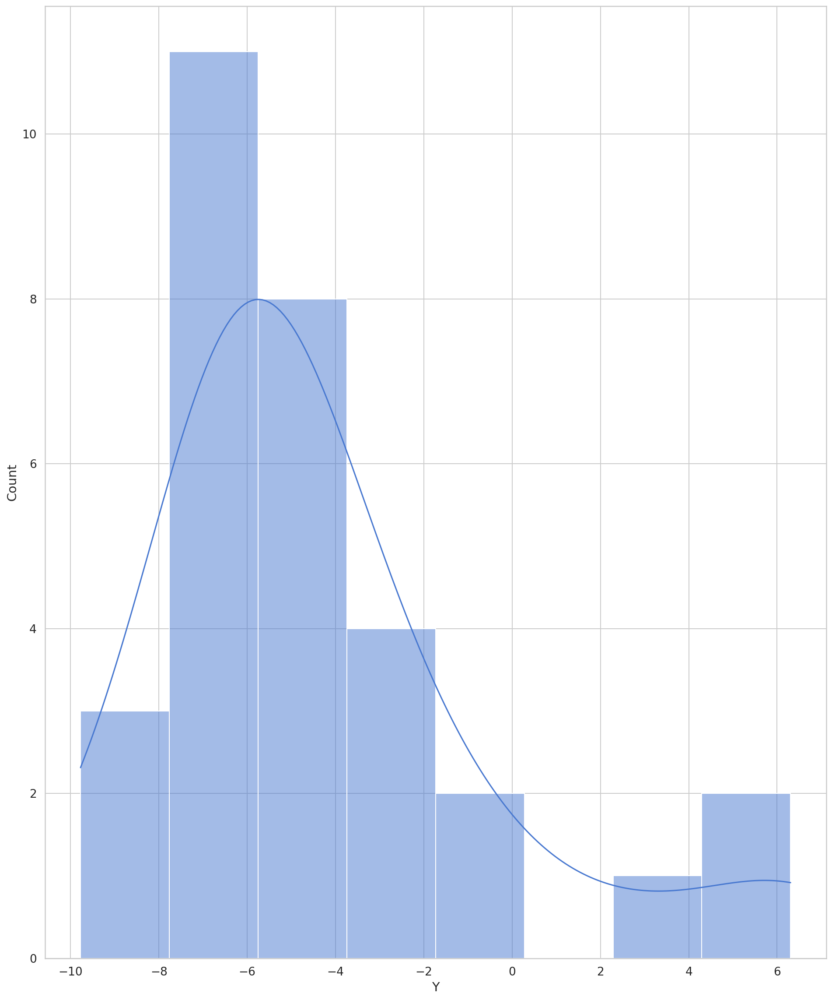

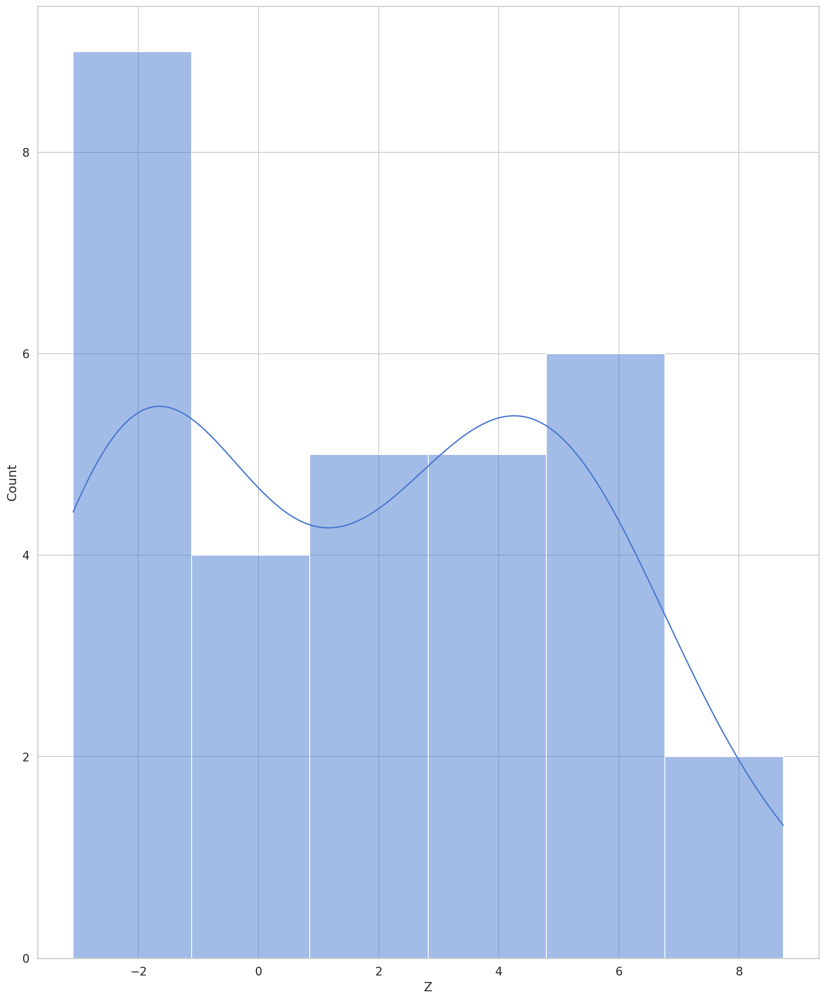

In [ ]:
# Gesture 3
plot_hist(df['X'][43:],df['Y'][43:],df['Z'][43:],df[43:])

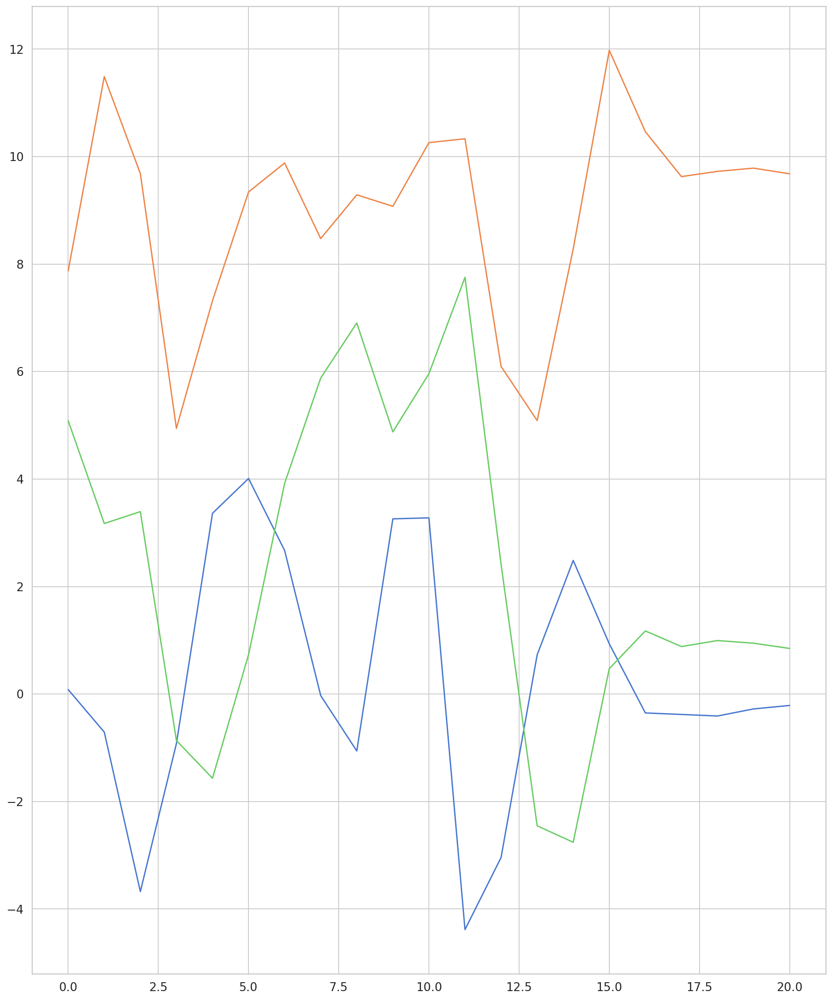

In [ ]:
# Gesture 1
plot_graph(df['X'][:21],df['Y'][:21],df['Z'][:21])


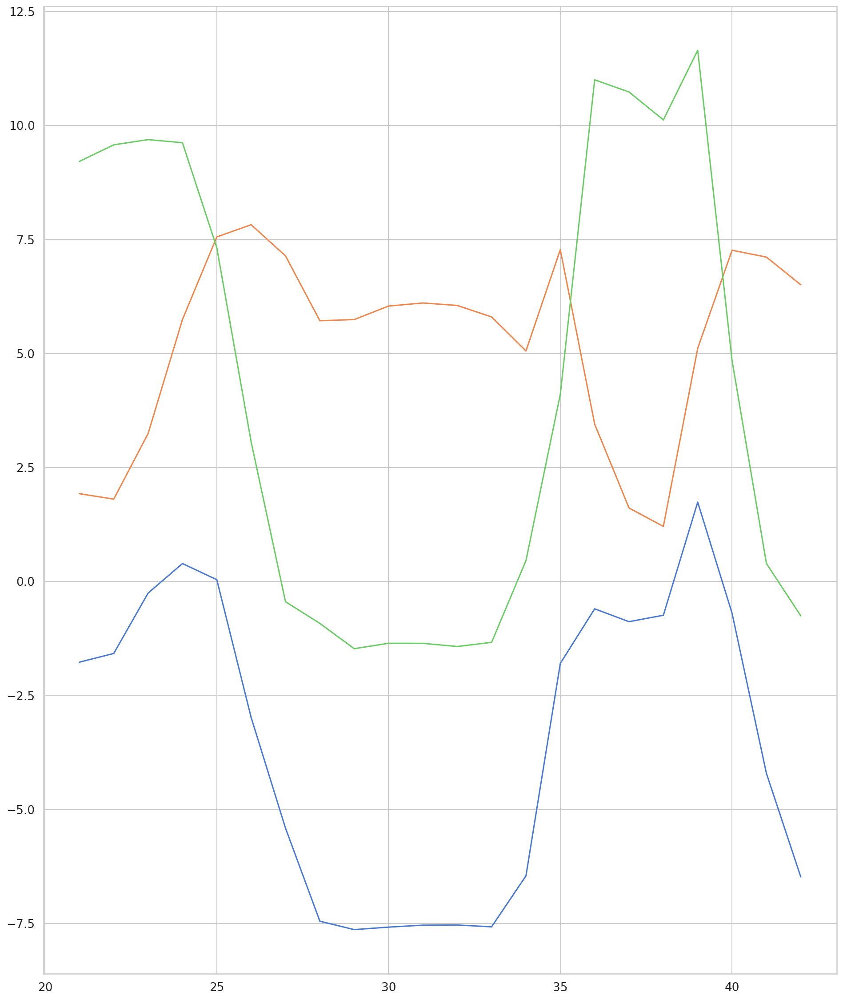

In [ ]:
# Gesture 2
plot_graph(df['X'][21:43],df['Y'][21:43],df['Z'][21:43])


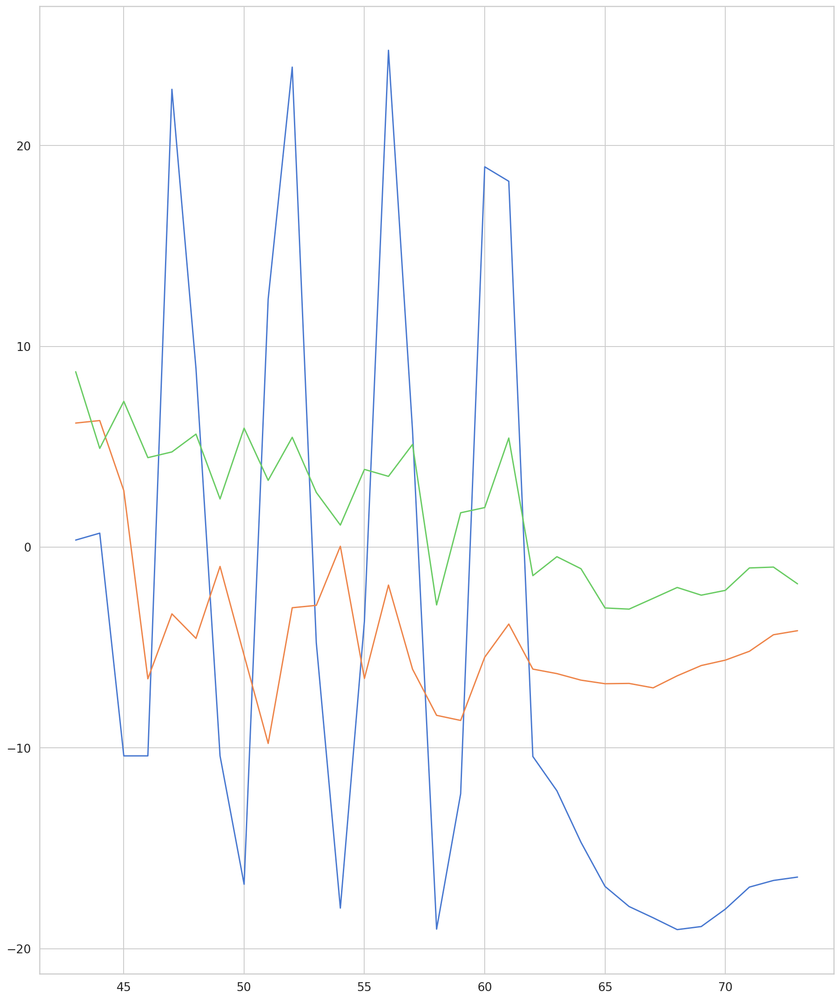

In [ ]:
# Gesture 3
plot_graph(df['X'][43:],df['Y'][43:],df['Z'][43:])

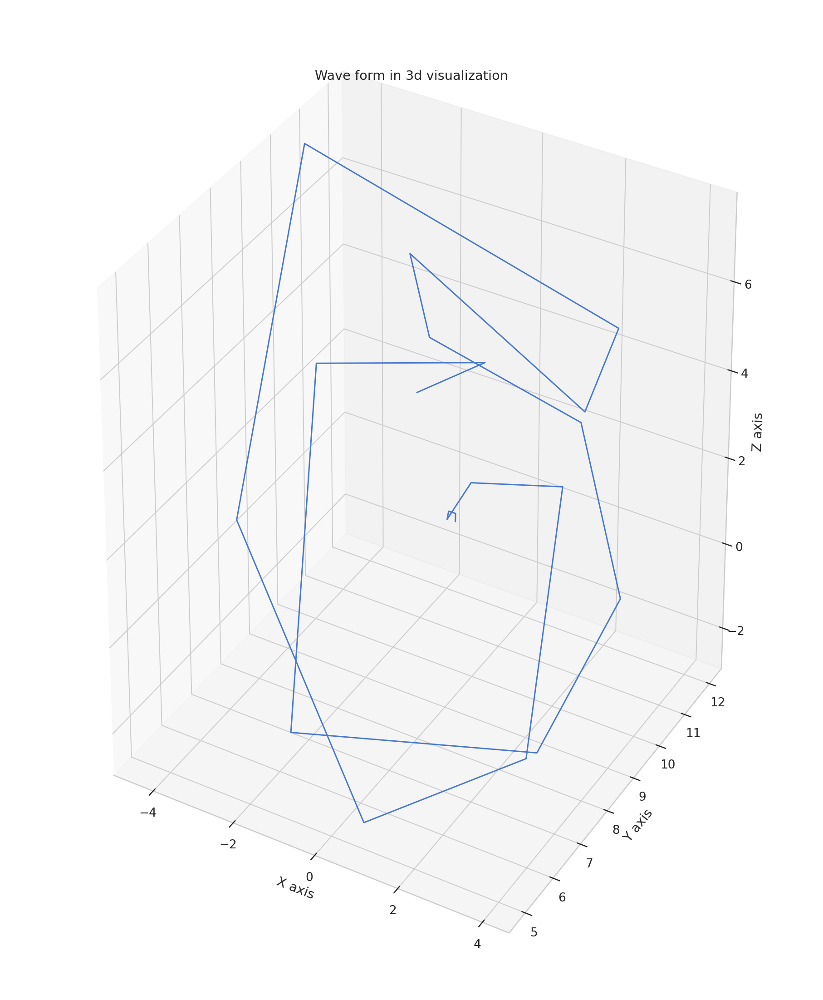

In [ ]:
plot_3d(df['X'][:21],df['Y'][:21],df['Z'][:21])


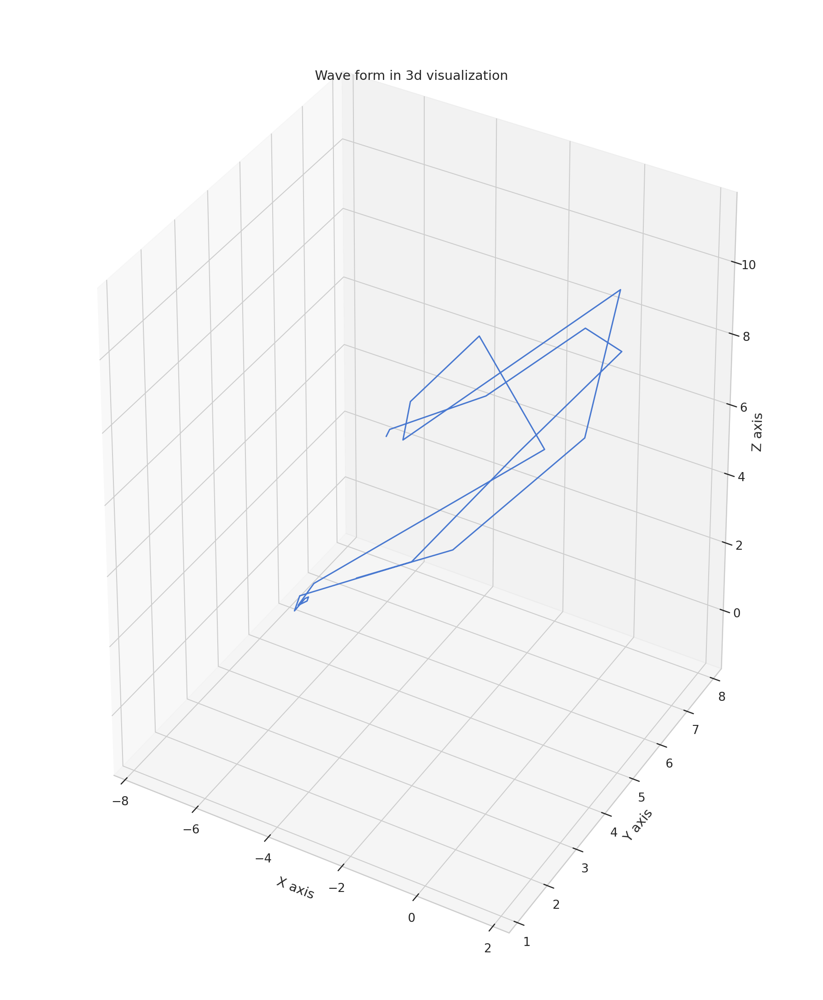

In [ ]:
# Gesture 2
plot_3d(df['X'][21:43],df['Y'][21:43],df['Z'][21:43])


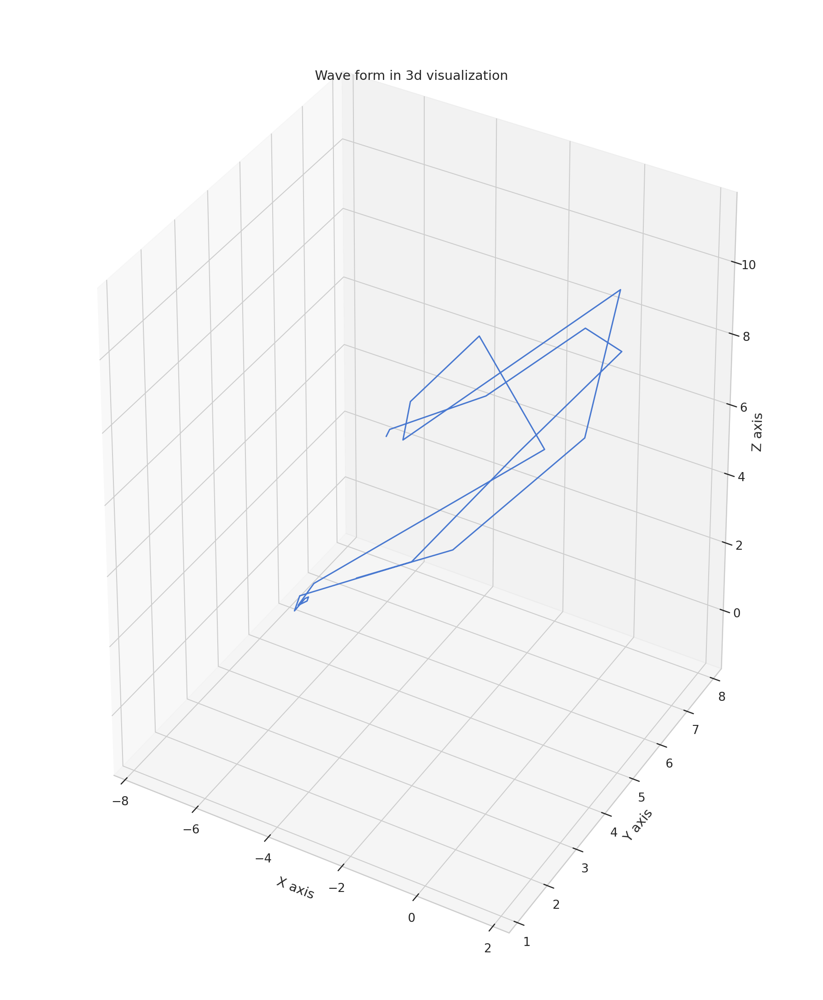

In [ ]:
# Gesture 3
plot_3d(df['X'][21:43],df['Y'][21:43],df['Z'][21:43])

##- Model Working :

- reference : https://www.youtube.com/watch?v=PCgrgHgy26c&ab_channel=VenelinValkov

In [ ]:

!pip install --quiet torch
!pip install --quiet pytorch-lightning
!pip install tensorboard


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:

import numpy as np
import pandas as pd
import torch
import torch.autograd as ag
import torch.nn as nn
import torch.nn.functional as functional
import torch.optim as optim
import pytorch_lightning as pl
import seaborn as sns
import matplotlib.pyplot as plt
import torchmetrics
import tensorflow as tf


from math import sqrt
from tqdm.auto import tqdm
from numpy import concatenate
from pandas.core.internals import concat
from torch.utils.data import Dataset, DataLoader
from pylab import rcParams
from matplotlib import rc
from matplotlib.ticker import MaxNLocator
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from multiprocessing import cpu_count
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.core.module import LightningModule
from torchmetrics import Accuracy
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Embedding
from tensorflow.keras.preprocessing import sequence
from matplotlib import pyplot
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error

In [ ]:
encoder = LabelEncoder()
df['y_encode'] = encoder.fit_transform(df['label'])
encoded = encoder.fit_transform(df['label'])
display(df)

,name,label,key_id,time,userId,X,Y,Z,y_encode
0,Heart,Thank you,2,1645733062258,dbhlWevKUePfKLXNNM2CWswc13l1,0.083151,7.874181,5.084748,1
1,Heart,Thank you,2,1645733062258,dbhlWevKUePfKLXNNM2CWswc13l1,-0.708275,11.487942,3.172883,1
2,Heart,Thank you,2,1645733062258,dbhlWevKUePfKLXNNM2CWswc13l1,-3.675375,9.683753,3.394219,1
3,Heart,Thank you,2,1645733062258,dbhlWevKUePfKLXNNM2CWswc13l1,-0.921835,4.944170,-0.865005,1
4,Heart,Thank you,2,1645733062258,dbhlWevKUePfKLXNNM2CWswc13l1,3.362514,7.318448,-1.566102,1
...,...,...,...,...,...,...,...,...,...
69,waving,Hello,1,1644622107453,hIMWm6XvwQd64HcSnR3nQKowjgy2,-18.894316,-5.894968,-2.391036,0
70,waving,Hello,1,1644622107453,hIMWm6XvwQd64HcSnR3nQKowjgy2,-18.027151,-5.626675,-2.151488,0
71,waving,Hello,1,1644622107453,hIMWm6XvwQd64HcSnR3nQKowjgy2,-16.930023,-5.185906,-1.035195,0
72,waving,Hello,1,1644622107453,hIMWm6XvwQd64HcSnR3nQKowjgy2,-16.599447,-4.361862,-0.992076,0


In [ ]:
encoded[:5]

array([1, 1, 1, 1, 1])

In [ ]:
encoder.classes_

array(['Hello', 'Thank you', 'want to rest'], dtype=object)

In [ ]:
feature_columns = df.columns.tolist()[5:-1]
feature_columns

['X', 'Y', 'Z']

In [ ]:
display(df)

,name,label,key_id,time,userId,X,Y,Z,y_encode
0,Heart,Thank you,2,1645733062258,dbhlWevKUePfKLXNNM2CWswc13l1,0.083151,7.874181,5.084748,1
1,Heart,Thank you,2,1645733062258,dbhlWevKUePfKLXNNM2CWswc13l1,-0.708275,11.487942,3.172883,1
2,Heart,Thank you,2,1645733062258,dbhlWevKUePfKLXNNM2CWswc13l1,-3.675375,9.683753,3.394219,1
3,Heart,Thank you,2,1645733062258,dbhlWevKUePfKLXNNM2CWswc13l1,-0.921835,4.944170,-0.865005,1
4,Heart,Thank you,2,1645733062258,dbhlWevKUePfKLXNNM2CWswc13l1,3.362514,7.318448,-1.566102,1
...,...,...,...,...,...,...,...,...,...
69,waving,Hello,1,1644622107453,hIMWm6XvwQd64HcSnR3nQKowjgy2,-18.894316,-5.894968,-2.391036,0
70,waving,Hello,1,1644622107453,hIMWm6XvwQd64HcSnR3nQKowjgy2,-18.027151,-5.626675,-2.151488,0
71,waving,Hello,1,1644622107453,hIMWm6XvwQd64HcSnR3nQKowjgy2,-16.930023,-5.185906,-1.035195,0
72,waving,Hello,1,1644622107453,hIMWm6XvwQd64HcSnR3nQKowjgy2,-16.599447,-4.361862,-0.992076,0


In [ ]:
df.key_id.value_counts()

1    31
0    22
2    21
Name: key_id, dtype: int64

In [ ]:
sequences = []
for key_id, group in df.groupby('key_id'):
  sequence_features = group[feature_columns]
  label = df[df.key_id == key_id].iloc[0].y_encode
  sequences.append((sequence_features,label))

In [ ]:
sequences[0]

(           X         Y          Z
 21 -1.768894  1.925624   9.213564
 22 -1.578067  1.806581   9.576674
 23 -0.254237  3.244668   9.690931
 24  0.393619  5.745765   9.623335
 25  0.039482  7.557132   7.319644
 26 -2.983252  7.824530   3.059224
 27 -5.409574  7.141379  -0.443869
 28 -7.450053  5.718846  -0.918844
 29 -7.634301  5.744569  -1.473381
 30 -7.579864  6.040681  -1.354936
 31 -7.536793  6.108278  -1.356132
 32 -7.533204  6.053841  -1.425524
 33 -7.573284  5.802595  -1.333999
 34 -6.455237  5.057230   0.457627
 35 -1.796412  7.277770   4.107280
 36 -0.599402  3.451647  11.001600
 37 -0.881157  1.612164  10.735997
 38 -0.739980  1.208375  10.123434
 39  1.740778  5.114060  11.650055
 40 -0.696910  7.265208   4.846064
 41 -4.207778  7.114460   0.395414
 42 -6.477969  6.507879  -0.752543, 2)

In [ ]:
train, test = train_test_split(sequences, test_size=0.3)

In [ ]:
print(len(train),len(test))

2 1


In [ ]:
#dataset
class Dataset1(Dataset):
  def __init__(self, sequences):
    self.sequences = sequences

  def __len__(self):
    return len(self.sequences)
  
  def __getitem__(self, id):
    sequence, label = self.sequences[id]
    return dict( sequence = torch.Tensor(sequence.to_numpy()), label = torch.tensor(label).long())

In [ ]:
class DataModule(pl.LightningDataModule):
  def __init__(self, train, test, batch_size):
    super().__init__()
    self.train = train
    self.test = test
    self.batch_size = batch_size
  
  def setup(self, stage=None):
    self.train_dataset = Dataset1(self.train)
    self.test_dataset = Dataset1(self.test)

  def train_dataloader(self):
    return DataLoader( self.train_dataset,
                      batch_size = self.batch_size,
                      shuffle=True,
                      num_workers = cpu_count()
                      )
  def val_dataloader(self):
    return DataLoader( self.test_dataset,
                      batch_size = self.batch_size,
                      shuffle=False,
                      num_workers = cpu_count()
                      )
  def test_dataloader(self):
    return DataLoader( self.test_dataset,
                      batch_size = self.batch_size,
                      shuffle=False,
                      num_workers = cpu_count()
                      )
  def predict_dataloader(self):
    return DataLoader( self.test_dataset,
                      batch_size = self.batch_size,
                      shuffle=False,
                      num_workers = cpu_count()
                      )

In [ ]:
N_EPOCHS = 50
BATCH_SIZE = 1
data_module = DataModule(train, test, BATCH_SIZE)

In [ ]:
#model
class SequenceModel(nn.Module):
  def __init__(self, n_features, n_classes, n_hidden=256, n_layers=3):
    super().__init__()
    self.n_hidden = n_hidden
    self.lstm = nn.LSTM(input_size = n_features, hidden_size = n_hidden, num_layers = n_layers, batch_first = True, dropout = 0.75)
    self.classifier = nn.Linear(n_hidden, n_classes)

  def forward(self, x):
    self.lstm.flatten_parameters()
    _, (hidden, _) = self.lstm(x)

    out = hidden[-1]

In [ ]:
#wrapper
class Predictor(pl.LightningModule):
  def __init__(self, n_features: int, n_classes: int):
    super().__init__()
    self.model = SequenceModel(n_features, n_classes)
    self.criterion = nn.CrossEntropyLoss()

  def forward(self, x, labels=None):
    output = self.model(x)
    loss = 0
    if labels is not None:
      loss = self.criterion(output, labels)
    return loss, output

  def training_step(self, batch, batch_id):
    sequences = batch["sequence"]
    labels = batch["label"]
    loss, outputs = self(sequences,labels)
    predictions = torch.argmax(outputs, dim = 1)
    step_accuracy = torchmetrics.functional.accuracy(predictions, labels)

    self.log("train_loss", loss, prog_bar=True, logger=True)
    self.log("train_accuracy", step_accuracy, prog_bar=True, logger=True, metric_attribute='train_acc')
    return {"loss": loss, "aaccuracy": step_accuracy}
  
  def validation_step(self, batch, batch_id):
    sequences = batch["sequence"]
    labels = batch["label"]
    loss, outputs = self(sequences,labels)
    predictions = torch.argmax(outputs, dim = 1)
    step_accuracy = torchmetrics.functional.accuracy(predictions, labels)

    self.log("val_loss", loss, prog_bar=True, logger=True)
    self.log("val_accuracy", step_accuracy, prog_bar=True, logger=True,  metric_attribute='test_acc')
    return {"loss": loss, "aaccuracy": step_accuracy}
  
  def test_step(self, batch, batch_id):
    sequences = batch["sequence"]
    labels = batch["label"]
    loss, outputs = self(sequences,labels)
    predictions = torch.argmax(outputs, dim = 1)
    step_accuracy = torchmetrics.functional.accuracy(predictions, labels)

    self.log("test_loss", loss, prog_bar=True, logger=True)
    self.log("test_accuracy", step_accuracy, prog_bar=True, logger=True, metric_attribute='test_acc')
    return {"loss": loss, "aaccuracy": step_accuracy}
  
  def configure_optimizers(self):
    return optim.Adam(self.parameters(), lr=0.0001)

In [ ]:
model = Predictor(n_features=len(feature_columns), n_classes=len(encoder.classes_))

In [ ]:
!pip install tensorboard

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
%load_ext tensorboard
%tensorboard --logdir ./lightning_logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1548), started 0:00:40 ago. (Use '!kill 1548' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
checkpoint_callback = ModelCheckpoint(
  dirpath = "checkpoints",
  filename = "best-checkpoint",
  save_top_k=1,
  verbose=True,
  monitor="val_loss",
  mode="min"  
)
logger = TensorBoardLogger("lightning_logs", name="gesture")

trainer = pl.Trainer(
  logger=logger,
  callbacks = [checkpoint_callback],
  max_epochs=N_EPOCHS,
  accelerator='cpu',
  log_every_n_steps = 10
)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [ ]:
trainer.fit(model, data_module)


INFO:pytorch_lightning.callbacks.model_summary:
  | Name      | Type             | Params
-----------------------------------------------
0 | model     | SequenceModel    | 1.3 M 
1 | criterion | CrossEntropyLoss | 0     
-----------------------------------------------
1.3 M     Trainable params
0         Non-trainable params
1.3 M     Total params
5.283     Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

TypeError: ignored

In [ ]:
trainer.validate(model, data_module)

Validation: 0it [00:00, ?it/s]

TypeError: ignored

In [ ]:
trainer.test(model, data_module)

Testing: 0it [00:00, ?it/s]

TypeError: ignored

# prediction


In [ ]:
trained_model = Predictor.load_from_checkpoint(
    trainer.checkpoint_callback.best_model_path,
    n_features = len(feature_columns),
    n_classes = len(encoder.classes_)
)
trained_model.freeze()

IsADirectoryError: ignored

In [ ]:
test_dataset = Dataset1(test)
predictions = []
labels1 = []
for item in tqdm(test_dataset):
  sequence = item['sequence']
  label = item['label']
  _,output = trained_model(sequence.unsqueeze(dim=0))
  prediction = torch.argmax(output,dim=1)
  predictions.append(prediction.item())
  labels1.append(label.item())
print(encoder.inverse_transform(labels1))

In [ ]:
print(classification_report(labels1, predictions,target_names=encoder.classes_,labels=[0,1]))

In [ ]:
def show_confusion_matrix(confusion_matrix):
  hmap = sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues")
  hmap.yaxis.set_ticklabels(hmap.yaxis.get_ticklabels(), rotation=0, ha='right')
  hmap.xaxis.set_ticklabels(hmap.xaxis.get_ticklabels(), rotation=30, ha='right')
  plt.ylabel('True')
  plt.xlabel('Predicted')

In [ ]:
cm = confusion_matrix(labels1, predictions, labels=[0,1])
df_cm = pd.DataFrame(cm, index=encoder.classes_, columns=encoder.classes_)
df_cm

In [ ]:
show_confusion_matrix(df_cm)

# End of Model

In [ ]:
# fix random seed for reproducibility
tf.random.set_seed(7)

In [ ]:
# design network
model = Sequential()
model.add(LSTM(50, input_shape=(X.shape[1], X.shape[2])))
model.add(Dense(1))
model.compile(loss='mae', optimizer='adam')
# fit network
history = model.fit(X, y, epochs=50, batch_size=72, validation_data=(X, y), verbose=2, shuffle=False)
# plot history
pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.legend()
pyplot.show()

In [ ]:
#scaler = MinMaxScaler(feature_range=(0, 1))
yhat = model.predict(X)
print(yhat)
test_X = X.reshape((X.shape[0], X.shape[1] * X.shape[2]))
# invert scaling for forecast
inv_yhat = concatenate((yhat, test_X[:, 1:]), axis=1)
#inv_yhat = scaler.inverse_transform(inv_yhat)
inv_yhat = inv_yhat[:,0]
# invert scaling for actual
test_y = y.reshape((len(y), 1))
inv_y = concatenate((test_y, test_X[:, 1:]), axis=1)
#inv_y = scaler.inverse_transform(inv_y)
inv_y = inv_y[:,0]
print(inv_yhat)
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
print('Test RMSE: %.3f' % rmse)

-- Text/Label Output data: